In [4]:
import numpy as np
import pandas as pd
import sklearn
import pickle
import mne
import os
import matplotlib.pyplot as plt
from mne.time_frequency import tfr_multitaper

%matplotlib inline

# prevent extensive logging
mne.set_log_level('WARNING')

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# set folder containing participants data as working directory
working_directory = "/content/drive/MyDrive/TD-BRAIN/TDBRAIN_participants_V2_data"
os.chdir(working_directory)
os.getcwd()

'D:\\Documents\\RU\\Master_Neurobiology\\Internship_jaar_2\\Project\\TD-BRAIN\\TDBRAIN_participants_V2_data'

In [ ]:

# load participants data
df_full = pd.read_csv('TDBRAIN_participants_V2.tsv', sep='\t', decimal=',')
df_full = df_full[df_full['participants_ID'].notna()]
df_full

,participants_ID,DISC/REP,indication,formal_status,Dataset,Consent,sessSeason,sessTime,Responder,Remitter,...,BDI_post,rTMS PROTOCOL,ADHD_pre_Hyp_leading,ADHD_pre_Att_leading,ADHD_post_Att_leading,ADHD_post_Hyp_leading,NF Protocol,YBOCS_pre,YBOCS_post,Unnamed: 110
0,sub-19681349,REPLICATION,REPLICATION,REPLICATION,REPLICATION,YES,REPLICATION,REPLICATION,REPLICATION,REPLICATION,...,REPLICATION,2,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,NaN
1,sub-19681385,REPLICATION,REPLICATION,REPLICATION,REPLICATION,YES,REPLICATION,REPLICATION,REPLICATION,REPLICATION,...,REPLICATION,1,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,NaN
2,sub-19684666,REPLICATION,REPLICATION,REPLICATION,REPLICATION,YES,REPLICATION,REPLICATION,REPLICATION,REPLICATION,...,REPLICATION,1,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,NaN
3,sub-19686324,REPLICATION,REPLICATION,REPLICATION,REPLICATION,YES,REPLICATION,REPLICATION,REPLICATION,REPLICATION,...,REPLICATION,2,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,NaN
4,sub-19687321,REPLICATION,REPLICATION,REPLICATION,REPLICATION,YES,REPLICATION,REPLICATION,REPLICATION,REPLICATION,...,REPLICATION,3,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,REPLICATION,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1342,sub-88078657,DISCOVERY,INSOMNIA,INSOMNIA,NaN,YES,fall,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1343,sub-88078749,DISCOVERY,INSOMNIA,INSOMNIA,NaN,YES,winter,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1344,sub-88078793,DISCOVERY,INSOMNIA,INSOMNIA,NaN,YES,winter,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1345,sub-88078837,DISCOVERY,INSOMNIA,INSOMNIA,NaN,YES,winter,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:

# only select relevant variables for current project
df_participants = df_full.loc[:, ('participants_ID', 'DISC/REP', 'indication', 'formal_status', 'Dataset', 'age', 'gender', 'sessID', 'nrSessions', 'EC', 'EO')]
df_participants = df_participants[df_participants['DISC/REP'] == 'DISCOVERY'] # select the discovery group

# create diagnosis variable from indication if formal_status is UNKNOWN
df_participants['diagnosis'] = df_participants['formal_status']
df_participants.loc[df_participants['diagnosis'] == 'UNKNOWN', 'diagnosis'] = df_participants['indication']

df_participants

,participants_ID,DISC/REP,indication,formal_status,Dataset,age,gender,sessID,nrSessions,EC,EO,diagnosis
120,sub-87963457,DISCOVERY,BURNOUT,BURNOUT,NaN,NaN,0.0,1.0,1.0,1.0,1.0,BURNOUT
121,sub-87963593,DISCOVERY,BURNOUT,BURNOUT,NaN,52.90,1.0,1.0,1.0,1.0,1.0,BURNOUT
122,sub-87963725,DISCOVERY,SMC,UNKNOWN,NaN,77.99,0.0,1.0,1.0,1.0,1.0,SMC
123,sub-87963769,DISCOVERY,SMC,UNKNOWN,NaN,83.30,1.0,1.0,1.0,1.0,1.0,SMC
124,sub-87964717,DISCOVERY,SMC,UNKNOWN,NaN,58.29,0.0,1.0,2.0,1.0,1.0,SMC
...,...,...,...,...,...,...,...,...,...,...,...,...
1342,sub-88078657,DISCOVERY,INSOMNIA,INSOMNIA,NaN,58.59,1.0,1.0,1.0,1.0,1.0,INSOMNIA
1343,sub-88078749,DISCOVERY,INSOMNIA,INSOMNIA,NaN,37.22,0.0,1.0,1.0,1.0,1.0,INSOMNIA
1344,sub-88078793,DISCOVERY,INSOMNIA,INSOMNIA,NaN,48.54,1.0,1.0,1.0,1.0,1.0,INSOMNIA
1345,sub-88078837,DISCOVERY,INSOMNIA,INSOMNIA,NaN,24.63,1.0,1.0,1.0,1.0,1.0,INSOMNIA


In [ ]:

import pandas as pd

# Eerst, inspecteer enkele van de vermeldingen in de diagnosekolom
print(df_participants['diagnosis'].unique())
print(df_participants['diagnosis'].value_counts())

# Definieer een functie die diagnoses classificeert, waarbij wordt aangepast voor variaties
def classify_diagnosis(diagnosis):
    if pd.isna(diagnosis):
        return 'Other'  # Behandel ontbrekende waarden
    diagnosis = str(diagnosis).strip()  # Converteer naar een string en verwijder eventuele spaties
    if diagnosis == 'HEALTHY':
        return 'HEALTHY'
    elif diagnosis == 'MDD':
        return 'MDD'
    return 'Other'

# Pas de classificatiefunctie toe op het dataframe
df_participants['diagnosis_group'] = df_participants['diagnosis'].apply(classify_diagnosis)

# Filter 'Other' en 'Comorbidity' categorieën eruit als ze niet nodig zijn
df_participants = df_participants[df_participants['diagnosis_group'].isin(['HEALTHY', 'MDD'])]

# Print het aantal om de classificatie te verifiëren
print("Counts in df_participants:")
print(df_participants['diagnosis_group'].value_counts())
print("Unique participant IDs count:", df_participants['participants_ID'].nunique())


['BURNOUT' 'SMC' 'HEALTHY' 'Dyslexia' 'CHRONIC PAIN' 'MDD' nan 'ADHD'
 'ADHD/ASPERGER' 'PDD NOS/DYSLEXIA' 'PDD NOS' 'WHIPLASH' 'ANXIETY'
 'ADHD/DYSLEXIA' 'ASD' 'TINNITUS' 'OCD' 'Tinnitus' 'PDD NOS ' 'PANIC'
 'MDD/ANXIETY' 'MIGRAINE' 'PDD NOS/ANXIETY' 'PARKINSON' 'BIPOLAR'
 'DYSPRAXIA' 'TINNITUS/MDD' 'ADHD/ASD/ANXIETY' 'MDD/ADHD' 'ADHD/PDD NOS'
 'ASPERGER' 'ADHD/EPILEPSY' 'PDD NOS/GTS' 'PDD NOS/ADHD' 'PDD NOS/ASD'
 'TBI' 'ADD' 'ADHD/ANXIETY' 'ADHD/DYSLEXIA/DYSCALCULIA' 'ADHD/MDD'
 'MDD/PANIC' 'DEPERSONALIZATION' 'MDD/TRAUMA' 'PTSD/ADHD' 'MDD/TUMOR'
 'ADHD/GTS' 'OCD/MDD' 'MDD/OCD' 'CONVERSION DX' 'ASD/ASPERGER'
 'MDD/ADHD/LYME' 'MSA-C' 'STROKE/PAIN' 'STROKE ' 'MDD/OCD/ADHD'
 'EPILEPSY/OCD' 'ADHD ' 'INSOMNIA' 'MDD/ADHD/ANOREXIA'
 'MDD/ANXIETY/TINNITUS']
diagnosis
MDD                          323
ADHD                         176
SMC                          119
OCD                           49
HEALTHY                       47
INSOMNIA                      32
TINNITUS                      3

In [ ]:

# change variables to correct data types
dtypes_dict = {'participants_ID' : 'string', 'DISC/REP' : 'category',
                'indication' : 'category', 'formal_status' : 'category',
                'Dataset' : 'category', 'age' : 'float', 'gender' : 'int',
                'sessID' : 'int', 'nrSessions' : 'int', 'EC' : 'bool', 'EO' : 'bool', 'diagnosis' : 'category'}
df_participants = df_participants.astype(dtypes_dict)
df_participants.info()

<class 'pandas.core.frame.DataFrame'>
Index: 370 entries, 245 to 1330
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   participants_ID  370 non-null    string  
 1   DISC/REP         370 non-null    category
 2   indication       370 non-null    category
 3   formal_status    370 non-null    category
 4   Dataset          132 non-null    category
 5   age              360 non-null    float64 
 6   gender           370 non-null    int32   
 7   sessID           370 non-null    int32   
 8   nrSessions       370 non-null    int32   
 9   EC               370 non-null    bool    
 10  EO               370 non-null    bool    
 11  diagnosis        370 non-null    category
 12  diagnosis_group  370 non-null    object  
dtypes: bool(2), category(5), float64(1), int32(3), object(1), string(1)
memory usage: 19.1+ KB


In [ ]:

# check for missing EC or EO recordings
print(df_participants[df_participants['EC'] == False].shape[0])
print(df_participants[df_participants['EO'] == False].shape[0])
df_participants[df_participants['EO'] == False]

0
0


,participants_ID,DISC/REP,indication,formal_status,Dataset,age,gender,sessID,nrSessions,EC,EO,diagnosis,diagnosis_group


In [ ]:

# store dataframe as pickle file
df_participants.to_pickle('df_participants.pkl')
df_test = pd.read_pickle('df_participants.pkl')
df_test

,participants_ID,DISC/REP,indication,formal_status,Dataset,age,gender,sessID,nrSessions,EC,EO,diagnosis,diagnosis_group
245,sub-87974617,DISCOVERY,HEALTHY,HEALTHY,NaN,NaN,0,1,1,True,True,HEALTHY,HEALTHY
246,sub-87974621,DISCOVERY,HEALTHY,HEALTHY,NaN,NaN,0,1,1,True,True,HEALTHY,HEALTHY
247,sub-87974665,DISCOVERY,HEALTHY,HEALTHY,NaN,23.37,0,1,1,True,True,HEALTHY,HEALTHY
248,sub-87974709,DISCOVERY,HEALTHY,HEALTHY,NaN,20.31,1,1,1,True,True,HEALTHY,HEALTHY
249,sub-87974841,DISCOVERY,HEALTHY,HEALTHY,NaN,21.59,1,1,1,True,True,HEALTHY,HEALTHY
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1320,sub-88076941,DISCOVERY,MDD,UNKNOWN,NaN,42.53,0,1,1,True,True,MDD,MDD
1326,sub-88077345,DISCOVERY,MDD,UNKNOWN,NaN,57.78,1,1,1,True,True,MDD,MDD
1328,sub-88077525,DISCOVERY,MDD,UNKNOWN,NaN,35.08,0,1,1,True,True,MDD,MDD
1329,sub-88077569,DISCOVERY,MDD,UNKNOWN,NaN,21.38,0,1,1,True,True,MDD,MDD


In [ ]:

df_participants['participants_ID'].nunique()

362

In [ ]:
df_participants = pd.read_pickle('/content/drive/MyDrive/TD-BRAIN/extracted_features/df_stat_features.pkl')
print(f'all participants: {df_participants.shape}')
df_participants.sample(5)

all participants: (370, 13)


,participants_ID,DISC/REP,indication,formal_status,Dataset,age,gender,sessID,nrSessions,EC,EO,diagnosis,diagnosis_group
682,sub-88025013,DISCOVERY,MDD,UNKNOWN,NaN,31.76,0,1,1,True,True,MDD,MDD
756,sub-88030369,DISCOVERY,MDD,UNKNOWN,NaN,61.58,0,1,1,True,True,MDD,MDD
312,sub-88004853,DISCOVERY,MDD,MDD,MDD-rTMS,19.76,0,1,1,True,True,MDD,MDD
1176,sub-88066053,DISCOVERY,MDD,UNKNOWN,NaN,28.09,0,1,1,True,True,MDD,MDD
1213,sub-88069069,DISCOVERY,MDD,UNKNOWN,NaN,51.57,1,1,1,True,True,MDD,MDD


In [ ]:
## Set montage based on channel names and locations provided in Van Dijk et al., (2022) (Copied from Anne van Duijvenbode)

ch_types = ['eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg',\
           'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', 'eeg', \
           'eog', 'eog', 'eog', 'eog', 'ecg', 'eog', 'emg']

ch_names = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FC3', 'FCz', 'FC4', 'T7', 'C3', 'Cz', 'C4', 'T8', 'CP3', \
            'CPz', 'CP4', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'Oz', 'O2', 'VPVA', 'VNVB', 'HPHL', 'HNHR', 'Erbs', \
            'OrbOcc', 'Mass']

dict_eeg_channels =  {ch_names[i]: ch_types[i] for i in range(len(ch_types))}

dict_ch_pos = {'Fp1' : [-26.81, 84.06, -10.56],
               'Fp2' : [29.41, 83.74, -10.04],
               'F7'  : [-66.99, 41.69, -15.96],
               'F3'  : [-48.05, 51.87, 39.87],
               'Fz'  : [0.90, 57.01, 66.36],
               'F4'  : [50.38, 51.84, 41.33],
               'F8'  : [68.71, 41.16, -15.31],
               'FC3' : [-58.83, 21.02, 54.82],
               'FCz' : [0.57, 24.63, 87.63],
               'FC4' : [60.29, 21.16, 55.58],
               'T7'  : [-83.36, -16.52, -12.65],
               'C3'  : [-65.57, -13.25, 64.98],
               'Cz'  : [0.23, -11.28, 99.81],
               'C4'  : [66.50, -12.80, 65.11],
               'T8'  : [84.44, -16.65, -11.79],
               'CP3' : [-65.51, -48.48, 68.57],
               'CPz' : [-0.42, -48.77, 98.37],
               'CP4' : [65.03, -48.35, 68.57],
               'P7': [-71.46, -75.17, -3.70],
               'P3'  : [-55.07, -80.11, 59.44],
               'Pz'  : [-0.87, -82.23, 82.43],
               'P4'  : [53.51, -80.13, 59.40],
               'P8' : [71.10, -75.17, -3.69],
               'O1'  : [-28.98, -114.52, 9.67],
               'Oz'  : [-1.41, -117.79, 15.84],
               'O2'  : [26.89, -114.68, 9.45]
              }

dict_ch_pos_m = {'Fp1' : [-0.2681, 0.8406, -0.1056],
               'Fp2' : [0.2941, 0.8374, -0.1004],
               'F7'  : [-0.6699, 0.4169, -0.1596],
               'F3'  : [-0.4805, 0.5187, 0.3987],
               'Fz'  : [0.0090, 0.5701, 0.6636],
               'F4'  : [0.5038, 0.5184, 0.4133],
               'F8'  : [0.6871, 0.4116, -0.1531],
               'FC3' : [-0.5883, 0.2102, 0.5482],
               'FCz' : [0.0057, 0.2463, 0.8763],
               'FC4' : [0.6029, 0.2116, 0.5558],
               'T7'  : [-0.8336, -0.1652, -0.1265],
               'C3'  : [-0.6557, -0.1325, 0.6498],
               'Cz'  : [0.0023, -0.1128, 0.9981],
               'C4'  : [0.6650, -0.1280, 0.6511],
               'T8'  : [0.8444, -0.1665, -0.1179],
               'CP3' : [-0.6551, -0.4848, 0.6857],
               'CPz' : [-0.042, -0.4877, 0.9837],
               'CP4' : [0.6503, -0.4835, 0.6857],
               'P7'  : [-0.7146, -0.7517, -0.0370],
               'P3'  : [-0.5507, -0.8011, 0.5944],
               'Pz'  : [-0.0087, -0.8223, 0.8243],
               'P4'  : [0.5351, -0.8013, 0.5940],
               'P8'  : [0.7110, -0.7517, -0.0369],
               'O1'  : [-0.2898, -1.1452, 0.0967],
               'Oz'  : [-0.0141, -1.1779, 0.1584],
               'O2'  : [0.2689, -1.1468, 0.0945]
              }

dict_ch_pos_array = {'Fp1' : np.array([-0.02681, 0.08406, -0.01056]),
               'Fp2' : np.array([0.02941, 0.08374, -0.01004]),
               'F7'  : np.array([-0.06699, 0.04169, -0.01596]),
               'F3'  : np.array([-0.04805, 0.05187, 0.03987]),
               'Fz'  : np.array([0.00090, 0.05701, 0.06636]),
               'F4'  : np.array([0.05038, 0.05184, 0.04133]),
               'F8'  : np.array([0.06871, 0.04116, -0.01531]),
               'FC3' : np.array([-0.05883, 0.02102, 0.05482]),
               'FCz' : np.array([0.00057, 0.02463, 0.08763]),
               'FC4' : np.array([0.06029, 0.02116, 0.05558]),
               'T7'  : np.array([-0.08336, -0.01652, -0.01265]),
               'C3'  : np.array([-0.06557, -0.01325, 0.06498]),
               'Cz'  : np.array([0.000023, -0.01128, 0.09981]),
               'C4'  : np.array([0.06650, -0.01280, 0.06511]),
               'T8'  : np.array([0.08444, -0.01665, -0.01179]),
               'CP3' : np.array([-0.06551, -0.04848, 0.06857]),
               'CPz' : np.array([-0.0042, -0.04877, 0.09837]),
               'CP4' : np.array([0.06503, -0.04835, 0.06857]),
               'P7'  : np.array([-0.07146, -0.07517, -0.00370]),
               'P3'  : np.array([-0.05507, -0.08011, 0.05944]),
               'Pz'  : np.array([-0.00087, -0.08223, 0.08243]),
               'P4'  : np.array([0.05351, -0.08013, 0.05940]),
               'P8'  : np.array([0.07110, -0.07517, -0.00369]),
               'O1'  : np.array([-0.02898, -0.11452, 0.00967]),
               'Oz'  : np.array([-0.00141, -0.11779, 0.01584]),
               'O2'  : np.array([0.02689, -0.11468, 0.00945])
              }

# channel groupings (left/mid/right)
l_frontal = ['F3', 'FC3']
m_frontal = ['Fz', 'FCz']
r_frontal = ['F4', 'FC4']
l_central = ['C3', 'CP3']
m_central = ['Cz', 'CPz']
r_central = ['C4', 'CP4']
l_posterior = ['P3', 'O1']
m_posterior = ['Pz', 'Oz']
r_posterior = ['P4', 'O2']
channel_groups = {
    'l_frontal': l_frontal,
    'm_frontal': m_frontal,
    'r_frontal': r_frontal,
    'l_central': l_central,
    'm_central': m_central,
    'r_central': r_central,
    'l_posterior': l_posterior,
    'm_posterior': m_posterior,
    'r_posterior': r_posterior
}
all_channels = l_frontal + m_frontal + r_frontal + l_central + m_central + r_central + l_posterior + m_posterior + r_posterior

# define (5) frequencies of interest for TFR per frequency band
delta = np.array([1, 1.5, 2, 2.5, 3]) # starting at one because of high-pass filter
theta = np.array([4, 4.75, 5.5, 6.25, 7])
alpha = np.array([8, 9, 10, 11, 12])
beta = np.array([13, 17.25, 21.5, 25.75, 30])
gamma = np.array([42, 54, 66, 78, 90])
bands = {'delta': delta, 'theta': theta, 'alpha': alpha, 'beta': beta, 'gamma': gamma}
all_freqs = np.concatenate([delta, theta, alpha, beta, gamma])

## Create montage
montage = mne.channels.make_dig_montage(ch_pos = dict_ch_pos_array, coord_frame = 'head')

# Create info object for MNE
info = mne.create_info(ch_names=ch_names, ch_types=ch_types, sfreq=500)
info.set_montage(montage=montage, on_missing= 'raise')
print(info)

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F7, F3, Fz, F4, F8, FC3, FCz, FC4, T7, C3, Cz, C4, T8, ...
 chs: 26 EEG, 5 EOG, 1 ECG, 1 EMG
 custom_ref_applied: False
 dig: 29 items (3 Cardinal, 26 EEG)
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 33
 projs: []
 sfreq: 500.0 Hz
>


In [ ]:
import scipy
# calculate variance in power per freq band and per channel group for each file and store in dataframe
eeg_dir = "/content/drive/MyDrive/TD-BRAIN/preprocessed"

#exlude_dirs = ['preprocessed', 'results_manuscript', 'adhd_sample'] # exclude these directories
sample_ids = df_participants['participants_ID'].tolist() # list of participants to include
# sample_ids = ['sub-87966293', 'sub-87966337']

df_ec_features = pd.DataFrame()  # create empty dataframe to store EC features
df_eo_features = pd.DataFrame()  # create empty dataframe to store EO features

# counter for progress
count = 1
if count == 1:
    total_files = 0
    for _, dirs, files in os.walk(eeg_dir):
        total_files += len([file for file in files if any(sample_id in file for sample_id in sample_ids) and '.npy' in file and 'ses-1' in file and 'BAD' not in file])

processed_IDs = []  # list to keep track of processed participants
for subdir, dirs, files in os.walk(eeg_dir):  # iterate through all files
    for file in files:
        if any(sample_id in file for sample_id in sample_ids):  # filter participants to include
            if 'ses-1' in file and '.npy' in file and 'BAD' not in file:  # filter first session, .npy files, and non-bad files
                filepath = os.path.join(subdir, file)  # path to eeg file

                # needs specific info object, because has one less channel
                info = mne.create_info(ch_names=ch_names[:32], ch_types=ch_types[:32], sfreq=500)
                info.set_montage(montage=montage, on_missing='raise')

                preprocessed_eeg = np.load(filepath, allow_pickle=True)
                raw = mne.io.RawArray(np.squeeze(preprocessed_eeg['data']), info)

                # epoch the data
                epochs = mne.make_fixed_length_epochs(raw, duration=9.95, overlap=0)

                if 'EC' in file:
                    cond = 'EC'
                if 'EO' in file:
                    cond = 'EO'

                # determine gender and diagnosis of participant corresponding to file
                participant_id = file.split('_')[0]
                gender_row = df_participants.loc[df_participants['participants_ID'] == participant_id, 'gender']
                diagnosis_row = df_participants.loc[df_participants['participants_ID'] == participant_id, 'diagnosis']

                if gender_row.empty or diagnosis_row.empty:
                    print(f"Missing data for participant {participant_id}")
                    continue

                gender = gender_row.values[0]
                diagnosis = diagnosis_row.values[0]

                # add data to empty dictionary as a list with the same length as the number of epochs
                feature_dict = {}
                feature_dict['ID'] = [participant_id] * epochs.get_data().shape[0]
                feature_dict['gender'] = [gender] * epochs.get_data().shape[0]
                feature_dict['diagnosis'] = [diagnosis] * epochs.get_data().shape[0]
                feature_dict['epoch'] = list(range(1, epochs.get_data().shape[0] + 1))

                # calculate TFR for all frequencies in freq bands and all channels in channel groups
                tfr_mt = tfr_multitaper(
                    epochs,
                    freqs=all_freqs,
                    n_cycles=(all_freqs / 2),
                    time_bandwidth=4,
                    use_fft=True,
                    return_itc=False,
                    average=False,
                    decim=8,  # decim reduces sampling rate of the tf decomposition by the defined factor
                    n_jobs=-1,
                    picks=all_channels
                )

                # TFR normalization with the total average power per frequency
                tfr_mt_data = tfr_mt.data  # shape [n_epochs, n_channels, n_freqs, n_times]
                tfr_mt_avg_freq = np.mean(tfr_mt_data, axis=3)  # average power over time per freq = shape [n_epochs, n_channels, n_freqs]
                total_tfr_mt_avg_freq = np.sum(tfr_mt_avg_freq, axis=2)  # sum avg power over freqs = shape [n_epochs, n_channels]
                tfr_mt_norm = tfr_mt_data / total_tfr_mt_avg_freq[:, :, np.newaxis, np.newaxis]  # normalize by dividing the signal by the sum of avg power over freqs
                tfr_mt.data = tfr_mt_norm  # store normalized data in tfr object
                ch_names_tfr = tfr_mt.ch_names
                for channel in ch_names_tfr:
                    # select channel of interest
                    tfr_mt_channel = tfr_mt.copy().pick([channel]).data  # shape [n_epochs, n_channels (1), n_freqs, n_times]
                    for band in bands:
                        # select frequencies of interest
                        start_index = np.where(tfr_mt.freqs == bands[band][0])[0][0]
                        end_index = np.where(tfr_mt.freqs == bands[band][-1])[0][0]
                        tfr_mt_band_channel = tfr_mt_channel[:, :, start_index:end_index, :]  # shape [n_epochs, n_channels, n_freqs, n_times]

                        # average signal over channels and frequencies to get one signal per channel and frequency band
                        tfr_mt_avg = np.mean(tfr_mt_band_channel, axis=(1, 2))  # average over channels and frequencies = shape [n_epochs, n_times]

                        # compute standard deviation in spectral power per epoch per channel
                        tfr_mt_std = np.std(tfr_mt_avg, axis=1)  # calculate stdev over time = shape [n_epochs]
                        # compute average spectral power per epoch per channel
                        tfr_mt_mean = np.mean(tfr_mt_avg, axis=1)  # calculate mean over time = shape [n_epochs]
                        # compute median spectral power per epoch per channel
                        tfr_mt_mean_median = np.median(tfr_mt_avg, axis=1)  # calculate median over time = shape [n_epochs]
                        # compute skewness of spectral power per epoch per channel
                        tfr_mt_skew = scipy.stats.skew(tfr_mt_avg, axis=1)  # calculate skew over time = shape [n_epochs]
                        # compute kurtosis of spectral power per epoch per channel group
                        tfr_mt_kurt = scipy.stats.kurtosis(tfr_mt_avg, axis=1)  # calculate kurt over time = shape [n_epochs]

                        # add to dictionary
                        feature_dict[f'{cond}_{channel}_{band}_std'] = tfr_mt_std  # shape [n_epochs]
                        feature_dict[f'{cond}_{channel}_{band}_mean'] = tfr_mt_mean  # shape [n_epochs]
                        feature_dict[f'{cond}_{channel}_{band}_median'] = tfr_mt_mean  # shape [n_epochs]
                        feature_dict[f'{cond}_{channel}_{band}_skew'] = tfr_mt_skew  # shape [n_epochs]
                        feature_dict[f'{cond}_{channel}_{band}_kurt'] = tfr_mt_kurt  # shape [n_epochs]

                # add to dataframe
                if cond == 'EC':
                    df_ec_features = pd.concat([df_ec_features, pd.DataFrame(feature_dict)], ignore_index=True)
                if cond == 'EO':
                    df_eo_features = pd.concat([df_eo_features, pd.DataFrame(feature_dict)], ignore_index=True)

                processed_IDs.append(participant_id)  # add participant to list of processed participants

                print(f'\rProgress: {count}/{total_files} files processed.', end='')
                count += 1

# merge EO and EC dataframes
print('\n')
print('Missing diagnoses in EO instances:', df_eo_features['diagnosis'].isnull().sum())  # sanity check
print('Missing diagnoses in EC instances:', df_ec_features['diagnosis'].isnull().sum())  # sanity check

# merge EO and EC dataframes
df_features = pd.merge(df_eo_features, df_ec_features.drop(columns=['gender']), how='outer', on=['ID', 'epoch', 'diagnosis'])
del df_ec_features, df_eo_features  # remove dataframes to free up memory

print(f'\n{df_features.shape = }')
df_features.sample(3)

Progress: 713/713 files processed.

Missing diagnoses in EO instances: 0
Missing diagnoses in EC instances: 0

df_features.shape = (4308, 904)


,ID,gender,diagnosis,epoch,EO_F3_delta_std,EO_F3_delta_mean,EO_F3_delta_median,EO_F3_delta_skew,EO_F3_delta_kurt,EO_F3_theta_std,...,EC_O2_beta_std,EC_O2_beta_mean,EC_O2_beta_median,EC_O2_beta_skew,EC_O2_beta_kurt,EC_O2_gamma_std,EC_O2_gamma_mean,EC_O2_gamma_median,EC_O2_gamma_skew,EC_O2_gamma_kurt
2313,sub-88044497,0.0,MDD,10,0.071253,0.106343,0.106343,0.850856,0.266239,0.032376,...,0.004619,0.015448,0.015448,0.568848,0.221261,0.002845,0.008451,0.008451,0.787099,0.237889
3154,sub-88058001,0.0,HEALTHY,11,0.081130,0.082874,0.082874,2.288525,6.811047,0.031174,...,0.017739,0.024803,0.024803,2.989461,10.008504,0.002737,0.008432,0.008432,0.120212,-0.657160
2110,sub-88039957,0.0,MDD,11,0.035886,0.055444,0.055444,1.223890,1.720750,0.041117,...,0.016913,0.027467,0.027467,1.558181,2.597912,0.000318,0.001003,0.001003,0.673435,0.282364


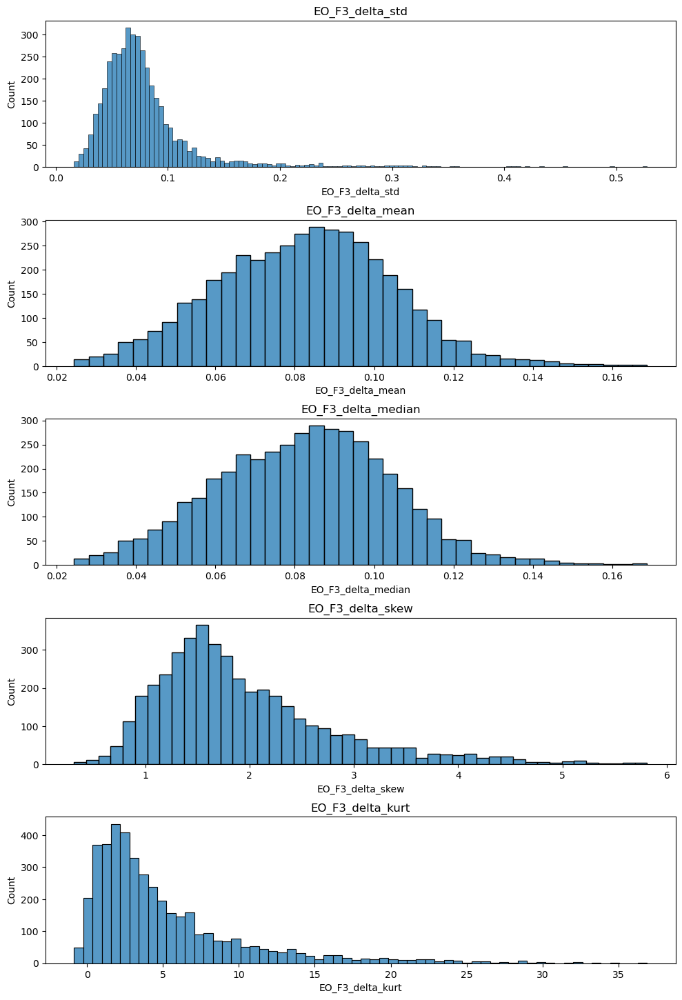

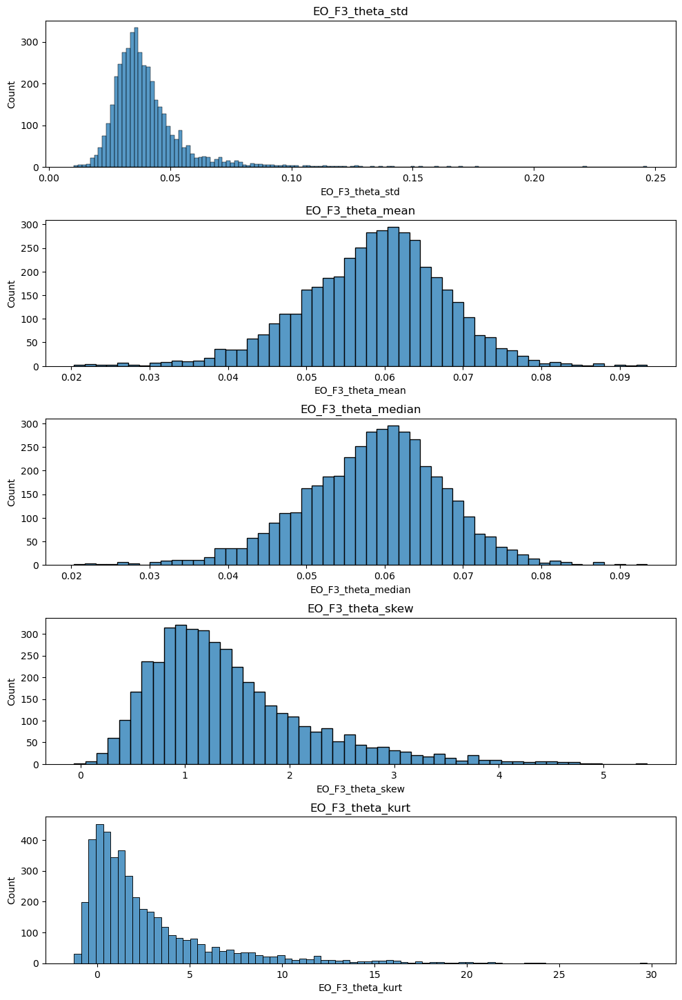

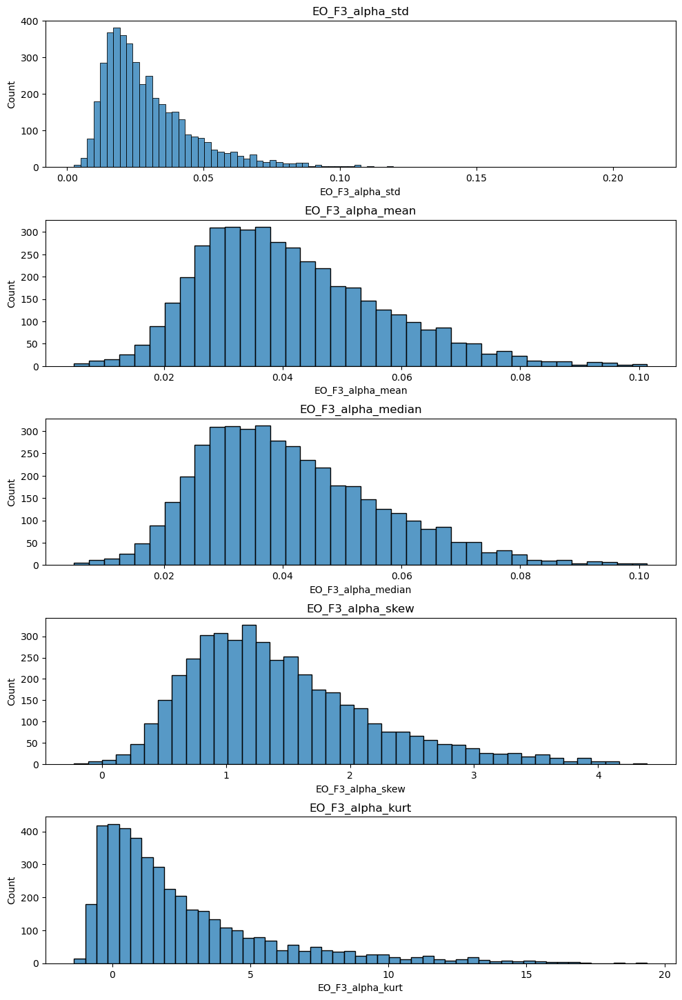

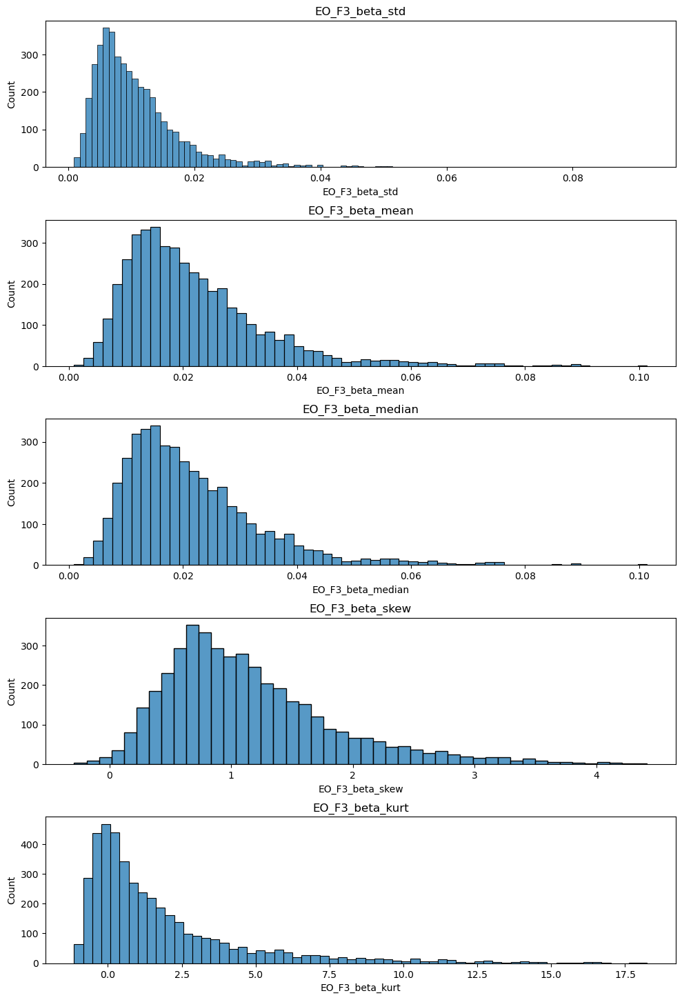

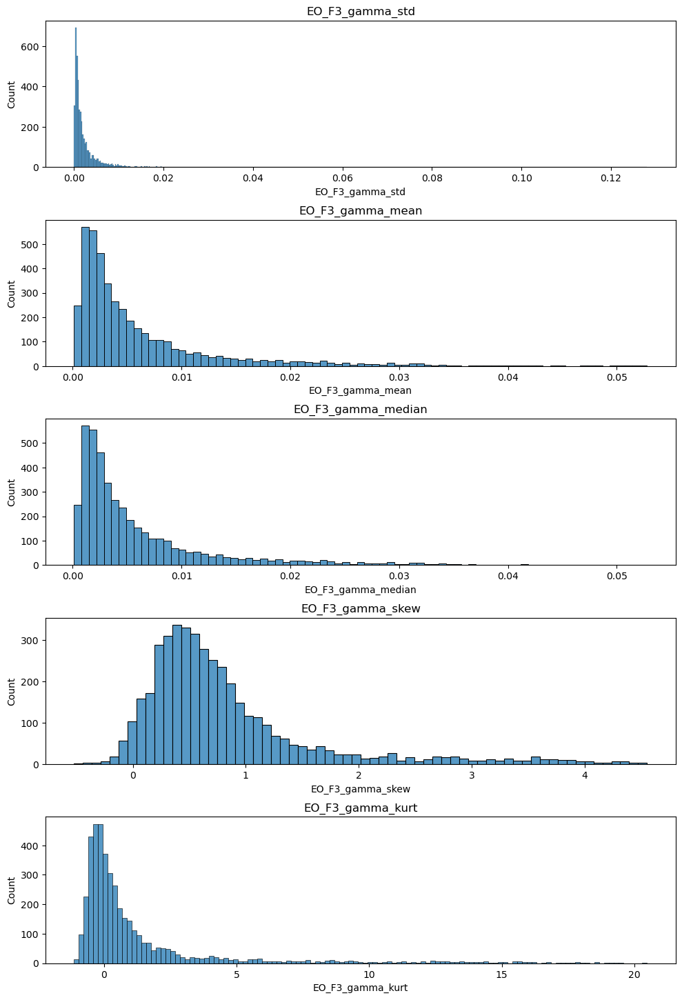

...

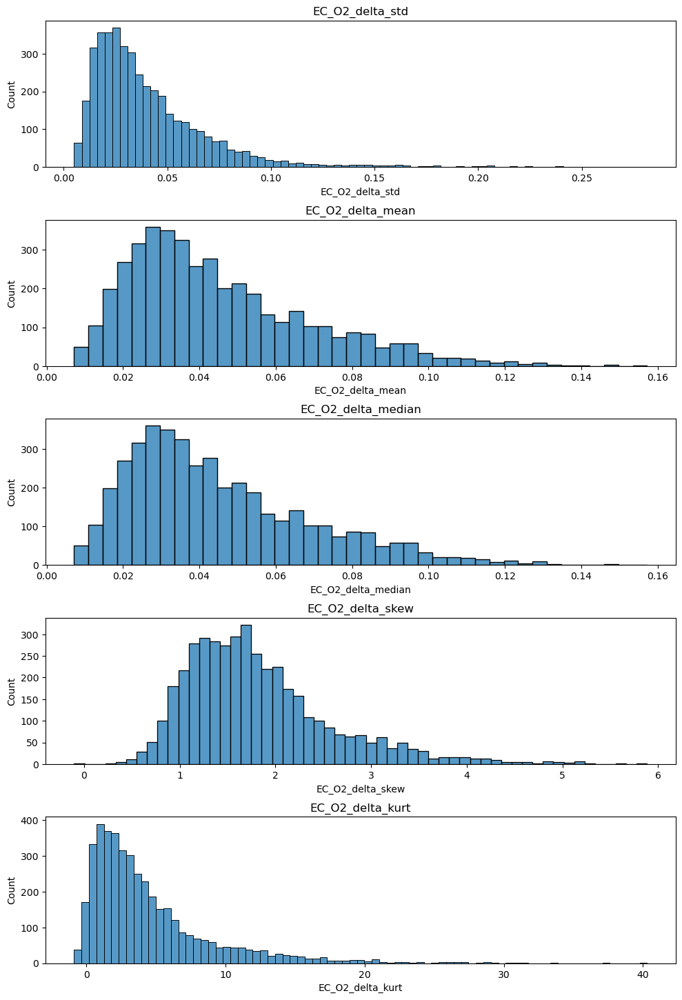

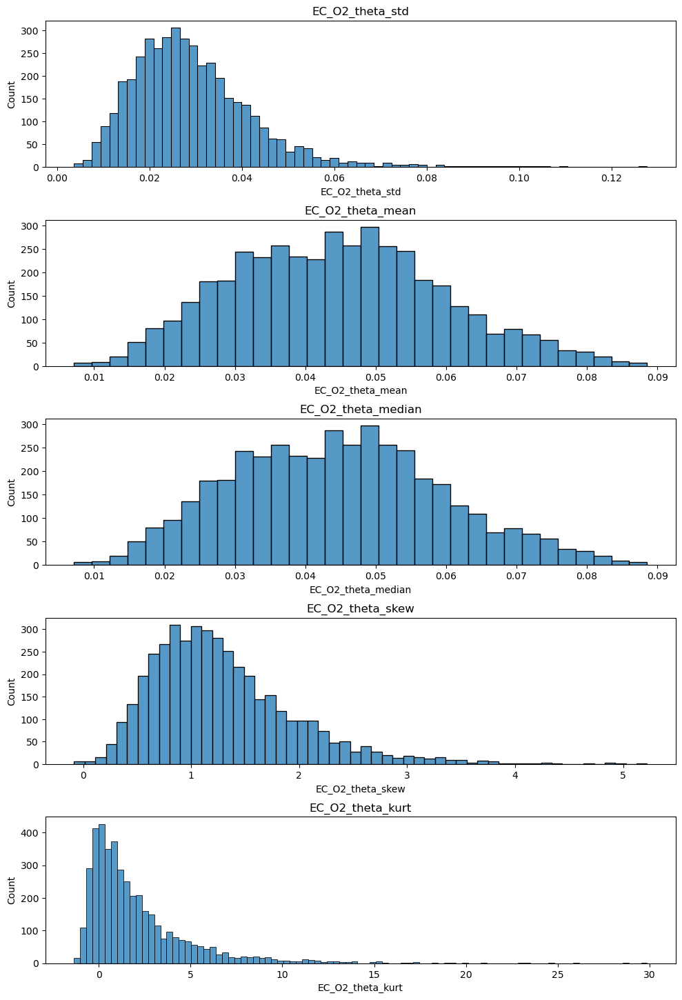

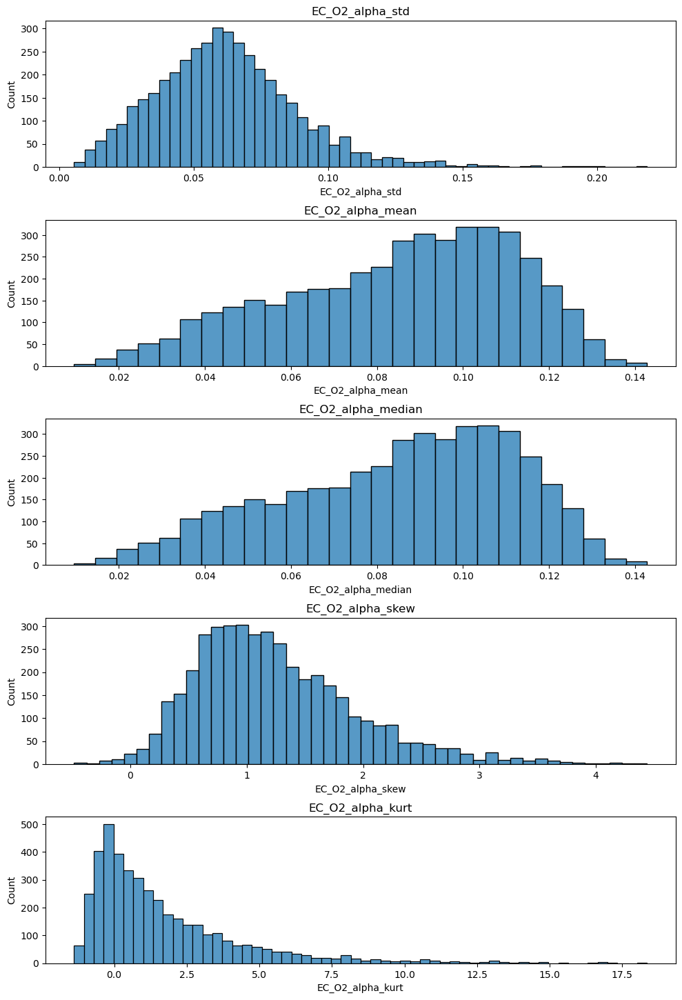

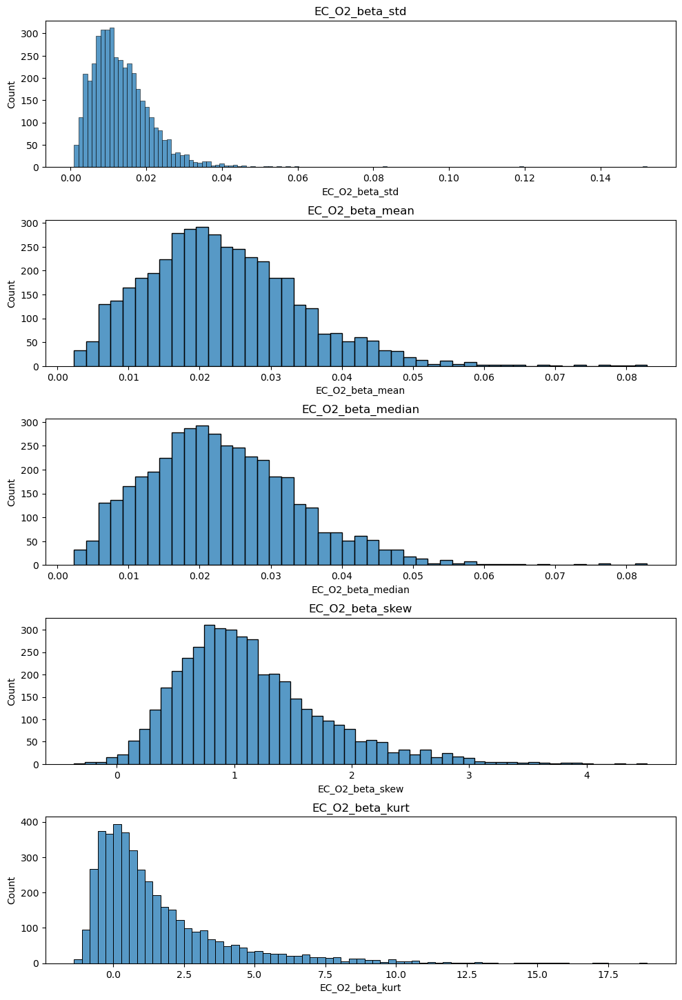

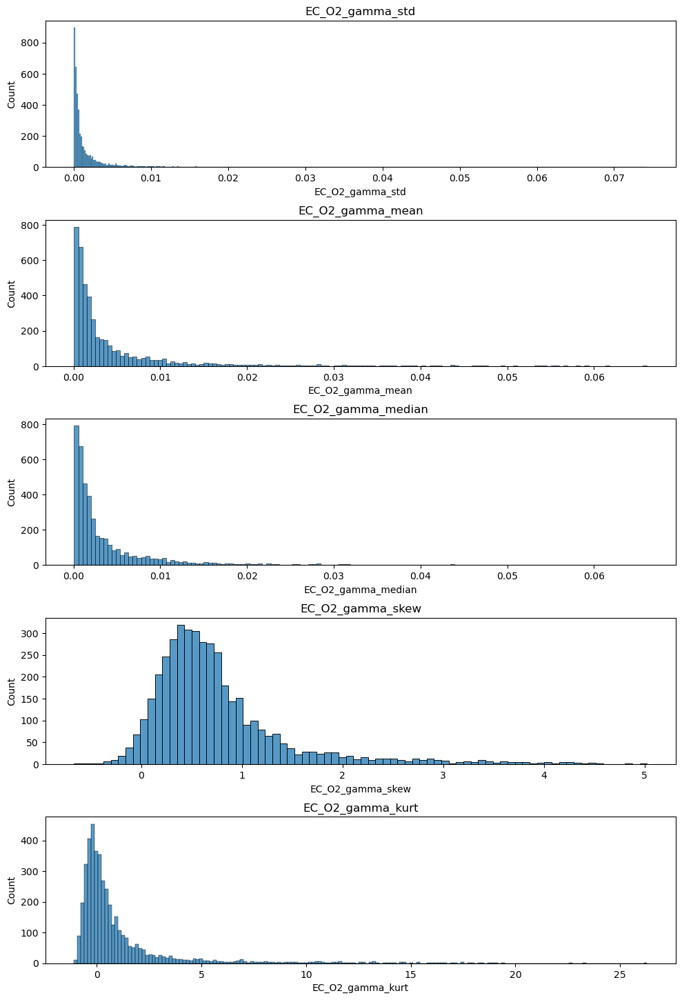

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric_cols = [col for col in df_features.columns if 'EC' in col or 'EO' in col]

# Iterate over numeric columns
for i in range(0, len(numeric_cols), 5):
    # Create a new figure for each set of 5 features
    fig, axs = plt.subplots(5, 1, figsize=(10, 15))

    for j in range(5):
        if i + j < len(numeric_cols):
            sns.histplot(df_features[numeric_cols[i + j]], kde=False, ax=axs[j])
            axs[j].set_title(numeric_cols[i + j])

    # Tight layout often produces nice results
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)

    # Display the current figure
    plt.show()
    plt.close(fig)


In [ ]:
df_features.to_pickle(""/content/drive/MyDrive/TD-BRAIN/extracted_features/df_stat_features_SVM.pkl)